## UKBB+HCP Exploratory Data Analysis

### Imports

In [1]:
%load_ext autoreload
%autoreload 2

In [46]:
from imports import *

In [66]:
from models import *
from data import * 
from env import *
from harmonize import *
from sim import *

In [67]:
# overall imports
import importlib
import data

# data load
from data.data_load import load_transcriptome, load_connectome, load_coords
from data.data_viz import plot_connectome, plot_connectome_with_labels, plot_transcriptome
importlib.reload(data.data_load)
importlib.reload(data.data_viz)

# data utils
from data.data_utils import (
    reconstruct_connectome,
    reconstruct_upper_triangle,
    make_symmetric,
    expand_X_symmetric,
    expand_Y_symmetric,
    expand_X_symmetric_shared,
    expand_shared_matrices,
    process_cv_splits,  
    expanded_inner_folds_combined_plus_indices
)

import data.data_utils
importlib.reload(data.data_utils)

# cross-validation classes
import data.cv_split
from data.cv_split import RandomCVSplit, SchaeferCVSplit, CommunityCVSplit, SubnetworkCVSplit
importlib.reload(data.cv_split)

# sim class
import sim.sim 
from sim.sim import Simulation
importlib.reload(sim.sim)


<module 'sim.sim' from '/scratch/asr655/neuroinformatics/GeneEx2Conn/sim/sim.py'>

## Load in structural connectomes

In [68]:
HCP_path = os.path.normpath(os.getcwd() + os.sep + os.pardir) + '/GeneEx2Conn_data/HCP1200_DTI/'
print(HCP_path)

/scratch/asr655/neuroinformatics/GeneEx2Conn_data/HCP1200_DTI/


In [69]:
# Load stuctural connectome from ENIGMA
HCP_enigma_structural_count = load_connectome(measure='SC', omit_subcortical=False)
HCP_enigma_structural_count_cortical = HCP_enigma_structural_count[:100, :100]

# Load 156-region structural connectivity matrices
HCP1200_S156_structural_count = np.log1p(loadmat(HCP_path + '/4S156/4S156_DTI_count.mat')['connectivity'])
HCP1200_S156_structural_count_cortical = HCP1200_S156_structural_count[:100, :100]
HCP1200_S156_structural_QA = loadmat(HCP_path + '/4S156/4S156_DTI_QA.mat')['connectivity']
HCP1200_S156_structural_QA_cortical = HCP1200_S156_structural_QA[:100, :100]

# Load 456-region structural connectivity matrices  
HCP1200_S456_structural_count = np.log1p(loadmat(HCP_path + '/4S456/4S456_DTI_count.mat')['connectivity'])
HCP1200_S456_structural_count_cortical = HCP1200_S456_structural_count[:400, :400]
HCP1200_S456_structural_QA = loadmat(HCP_path + '/4S456/4S456_DTI_QA.mat')['connectivity']
HCP1200_S456_structural_QA_cortical = HCP1200_S456_structural_QA[:400, :400]


## Load in functional connectomes

In [70]:
UKBB_path = os.path.normpath(os.getcwd() + os.sep + os.pardir) + '/GeneEx2Conn_data/Penn_UKBB_data/'
print(UKBB_path)

UKBB_demographics = pd.read_csv(UKBB_path + '/metadata/UKBB_MasterList_DemogInfo_part.csv')
UKBB_demographics.head()

/scratch/asr655/neuroinformatics/GeneEx2Conn_data/Penn_UKBB_data/


,MRID,Age,IsF,Race
0,1000038_2_0,64.64,1.0,British
1,1000108_2_0,68.39,0.0,British
2,1000149_2_0,76.67,0.0,Irish
3,1000201_2_0,67.24,1.0,British
4,1000213_2_0,67.73,1.0,British


In [71]:
UKBB_S156_functional_conn = pd.read_csv('./data/UKBB/UKBB_S156_functional_conn.csv')
UKBB_S156_functional_conn_cortical = np.array(UKBB_S156_functional_conn)[:100, :100]
UKBB_S156_labels = pd.read_csv('./data/UKBB/schaefer156_atlas_info.txt', sep='\t')['label_7network'].tolist()

UKBB_S456_functional_conn = pd.read_csv('./data/UKBB/UKBB_S456_functional_conn.csv')
UKBB_S456_functional_conn_cortical = np.array(UKBB_S456_functional_conn)[:400, :400]
UKBB_S456_labels = pd.read_csv('./data/UKBB/schaefer456_atlas_info.txt', sep='\t')['label_7network'].tolist()

HCP_enigma_functional_conn = load_connectome(measure='FC', omit_subcortical=False)
HCP_enigma_functional_conn_cortical = load_connectome(measure='FC', omit_subcortical=True)
HCP_labels = pd.read_csv('./data/enigma/schaef114_regions.txt', header=None).values.flatten().tolist()


## Low-dimensional visualization combining transcriptome and connectome

In [79]:
AHBA_transcriptome = load_transcriptome(omit_subcortical=False)

print('transcriptome', AHBA_transcriptome.shape)
print('structural connectome', HCP_enigma_structural_count.shape)
print('functional connectome', HCP_enigma_functional_conn.shape)

transcriptome (114, 11053)
structural connectome (114, 114)
functional connectome (114, 114)


In [80]:
schaef_df = pd.read_csv( os.path.normpath(os.getcwd() + os.sep + os.pardir) + '/GeneEx2Conn_data/atlas_info/schaef114.csv')
region_labels = schaef_df['label_x'].values
schaef_network_labels = schaef_df['network_label'].values
mni_coords = schaef_df[['mni_x', 'mni_y', 'mni_z']].values

In [82]:
network_colors = {
    'Vis': '#800080',  # Purple
    'SomMot': '#0000FF',  # Blue
    'DorsAttn': '#008000',  # Green
    'SalVentAttn': '#EE82EE',  # Violet
    'Limbic': '#FFFDD0',  # Cream
    'Cont': '#FFA500',  # Orange
    'Default': '#FF0000',  # Red
    'Subcortex': '#808080',  # Gray
    'Cerebellum': '#00FF00'  # Lime
}

In [83]:
# Create 3D scatter plot using plotly for interactivity
import plotly.graph_objects as go

# Create figure
fig = go.Figure()

# Plot each point colored by network
for network in np.unique(schaef_network_labels):
    mask = schaef_network_labels == network
    fig.add_trace(go.Scatter3d(
        x=mni_coords[mask, 0],
        y=mni_coords[mask, 1],
        z=mni_coords[mask, 2],
        mode='markers',
        marker=dict(
            size=8,  # Increased marker size
            color=network_colors[network],
            opacity=0.6
        ),
        name=network,
        text=region_labels[mask],  # Add region labels for hover text
        hoverinfo='text'  # Show only the text on hover
    ))

# Calculate axis ranges to make them equal
x_range = [mni_coords[:,0].min(), mni_coords[:,0].max()]
y_range = [mni_coords[:,1].min(), mni_coords[:,1].max()]
z_range = [mni_coords[:,2].min(), mni_coords[:,2].max()]

max_range = max(x_range[1]-x_range[0], y_range[1]-y_range[0], z_range[1]-z_range[0])

# Update layout
fig.update_layout(
    scene=dict(
        xaxis=dict(range=[x_range[0], x_range[0] + max_range]),
        yaxis=dict(range=[y_range[0], y_range[0] + max_range]), 
        zaxis=dict(range=[z_range[0], z_range[0] + max_range]),
        xaxis_title='X (mm)',
        yaxis_title='Y (mm)',
        zaxis_title='Z (mm)',
        aspectmode='cube'
    ),
    title='Brain Regions Colored by Network',
    showlegend=True,
    width=800,
    height=800
)

fig.show()


In [84]:
# Compute 2D and 3D UMAP embeddings of gene expression data
import umap
umap_2d = umap.UMAP(n_components=2, random_state=42)
umap_2d_embedding = umap_2d.fit_transform(AHBA_transcriptome)

umap_3d = umap.UMAP(n_components=3, random_state=42)
umap_3d_embedding = umap_3d.fit_transform(AHBA_transcriptome)

# Create figures for UMAP visualization
fig_2d = go.Figure()
fig_3d = go.Figure()

# Plot each point colored by network - 2D
for network in np.unique(schaef_network_labels):
    mask = schaef_network_labels == network
    fig_2d.add_trace(go.Scatter(
        x=umap_2d_embedding[mask, 0],
        y=umap_2d_embedding[mask, 1],
        mode='markers',
        marker=dict(
            size=8,
            color=network_colors[network],
            opacity=0.6
        ),
        name=network,
        text=region_labels[mask],
        hoverinfo='text'
    ))

# Plot each point colored by network - 3D
for network in np.unique(schaef_network_labels):
    mask = schaef_network_labels == network
    fig_3d.add_trace(go.Scatter3d(
        x=umap_3d_embedding[mask, 0],
        y=umap_3d_embedding[mask, 1], 
        z=umap_3d_embedding[mask, 2],
        mode='markers',
        marker=dict(
            size=6,
            color=network_colors[network],
            opacity=0.6
        ),
        name=network,
        text=region_labels[mask],
        hoverinfo='text'
    ))

# Update 2D layout
fig_2d.update_layout(
    xaxis_title='UMAP 1',
    yaxis_title='UMAP 2',
    title='2D UMAP of Gene Expression Colored by Network',
    showlegend=True,
    width=800,
    height=800
)

# Update 3D layout
fig_3d.update_layout(
    scene=dict(
        xaxis_title='UMAP 1',
        yaxis_title='UMAP 2', 
        zaxis_title='UMAP 3',
        aspectmode='cube'
    ),
    title='3D UMAP of Gene Expression Colored by Network',
    showlegend=True,
    width=800,
    height=800
)

fig_2d.show()
fig_3d.show()


In [87]:
# Create a new figure for 2D UMAP with structural connections
fig_2d_struct = go.Figure()

# Plot the nodes colored by network
for network in np.unique(schaef_network_labels):
    mask = schaef_network_labels == network
    fig_2d_struct.add_trace(go.Scatter(
        x=umap_2d_embedding[mask, 0],
        y=umap_2d_embedding[mask, 1],
        mode='markers',
        marker=dict(
            size=12,
            color=network_colors[network],
            opacity=1
        ),
        name=network,
        text=region_labels[mask],
        hoverinfo='text'
    ))


connectome = HCP_enigma_structural_count

# Add structural connections as edges
# Set negative values to 0 and normalize connection strengths for line width scaling
connectome_clipped = np.clip(connectome, 0, None)
max_strength = np.max(connectome_clipped)
min_strength = np.min(connectome_clipped)
norm_strength = (connectome_clipped - min_strength) / (max_strength - min_strength)

# Add edges for connections within specified range
min_threshold = 0.1  # Adjust minimum threshold as needed
max_threshold = 1  # Adjust maximum threshold as needed
colors = plt.cm.Reds

for i in range(len(connectome)):
    for j in range(i+1, len(connectome)):
        if min_threshold <= norm_strength[i,j] <= max_threshold:
            # Get color from viridis colormap based on normalized strength
            rgba_color = colors(norm_strength[i,j])
            # Calculate opacity based on connection strength
            opacity = 0.3 * norm_strength[i,j]**2 # Stronger connections will be more opaque
            # Convert to rgba string with strength-based transparency
            edge_color = f'rgba({int(rgba_color[0]*255)},{int(rgba_color[1]*255)},{int(rgba_color[2]*255)},{opacity})'
            
            fig_2d_struct.add_trace(go.Scatter(
                x=[umap_2d_embedding[i,0], umap_2d_embedding[j,0]],
                y=[umap_2d_embedding[i,1], umap_2d_embedding[j,1]],
                mode='lines',
                line=dict(
                    width=1.5,  # Fixed width for all edges
                    color=edge_color
                ),
                hoverinfo='none',
                showlegend=False
            ))

# Update layout
fig_2d_struct.update_layout(
    xaxis_title='UMAP 1',
    yaxis_title='UMAP 2',
    title='2D UMAP of Gene Expression with Structural Connections',
    showlegend=True,
    width=1000,
    height=1000
)

fig_2d_struct.show()


In [88]:
# Create a new figure for 2D UMAP with structural connections
fig_2d_struct = go.Figure()

# Plot the nodes colored by network
for network in np.unique(schaef_network_labels):
    mask = schaef_network_labels == network
    fig_2d_struct.add_trace(go.Scatter(
        x=umap_2d_embedding[mask, 0],
        y=umap_2d_embedding[mask, 1],
        mode='markers',
        marker=dict(
            size=12,
            color=network_colors[network],
            opacity=1
        ),
        name=network,
        text=region_labels[mask],
        hoverinfo='text'
    ))


connectome = HCP_enigma_functional_conn

# Add structural connections as edges
# Set negative values to 0 and normalize connection strengths for line width scaling
connectome_clipped = np.clip(connectome, 0, 1)
max_strength = np.max(connectome_clipped)
min_strength = np.min(connectome_clipped)
norm_strength = (connectome_clipped - min_strength) / (max_strength - min_strength)

# Add edges for connections within specified range
min_threshold = 0.1  # Adjust minimum threshold as needed
max_threshold = 1  # Adjust maximum threshold as needed
# Create BuGn colormap
colors = plt.cm.Blues

for i in range(len(connectome)):
    for j in range(i+1, len(connectome)):
        if min_threshold <= norm_strength[i,j] <= max_threshold:
            # Get color from viridis colormap based on normalized strength
            rgba_color = colors(norm_strength[i,j])
            # Calculate opacity based on connection strength
            opacity = 0.3 * norm_strength[i,j]**2 # Stronger connections will be more opaque
            # Convert to rgba string with strength-based transparency
            edge_color = f'rgba({int(rgba_color[0]*255)},{int(rgba_color[1]*255)},{int(rgba_color[2]*255)},{opacity})'
            
            fig_2d_struct.add_trace(go.Scatter(
                x=[umap_2d_embedding[i,0], umap_2d_embedding[j,0]],
                y=[umap_2d_embedding[i,1], umap_2d_embedding[j,1]],
                mode='lines',
                line=dict(
                    width=1.5,  # Fixed width for all edges
                    color=edge_color
                ),
                hoverinfo='none',
                showlegend=False
            ))

# Update layout
fig_2d_struct.update_layout(
    xaxis_title='UMAP 1',
    yaxis_title='UMAP 2',
    title='2D UMAP of Gene Expression with Functional Connections',
    showlegend=True,
    width=1000,
    height=1000
)

fig_2d_struct.show()


In [90]:
# Create a new figure for 2D UMAP with both structural and functional connections
fig_2d_combined = go.Figure()

# Plot the nodes colored by network
for network in np.unique(schaef_network_labels):
    mask = schaef_network_labels == network
    fig_2d_combined.add_trace(go.Scatter(
        x=umap_2d_embedding[mask, 0],
        y=umap_2d_embedding[mask, 1],
        mode='markers',
        marker=dict(
            size=12,
            color=network_colors[network],
            opacity=1
        ),
        name=network,
        text=region_labels[mask],
        hoverinfo='text'
    ))

# Process structural connections
structural_connectome = HCP_enigma_structural_count
struct_clipped = np.clip(structural_connectome, 0, None)
struct_max = np.max(struct_clipped)
struct_min = np.min(struct_clipped)
struct_norm = (struct_clipped - struct_min) / (struct_max - struct_min)

# Process functional connections
functional_connectome = HCP_enigma_functional_conn
func_clipped = np.clip(functional_connectome, 0, 1)
func_max = np.max(func_clipped)
func_min = np.min(func_clipped)
func_norm = (func_clipped - func_min) / (func_max - func_min)

# Set thresholds and colormaps
min_threshold = 0.5
max_threshold = 1
struct_colors = plt.cm.Reds 
func_colors = plt.cm.Blues 

# Add edges for both types of connections
for i in range(len(structural_connectome)):
    for j in range(i+1, len(structural_connectome)):
        # Add structural connections
        if min_threshold <= struct_norm[i,j] <= max_threshold:
            rgba_color = struct_colors(struct_norm[i,j])
            opacity = 0.3 * struct_norm[i,j]**2
            edge_color = f'rgba({int(rgba_color[0]*255)},{int(rgba_color[1]*255)},{int(rgba_color[2]*255)},{opacity})'
            
            fig_2d_combined.add_trace(go.Scatter(
                x=[umap_2d_embedding[i,0], umap_2d_embedding[j,0]],
                y=[umap_2d_embedding[i,1], umap_2d_embedding[j,1]],
                mode='lines',
                line=dict(
                    width=1.5,
                    color=edge_color
                ),
                name='Structural' if i == 0 and j == 1 else None,  # Add name only once for legend
                hoverinfo='none',
                showlegend=True if i == 0 and j == 1 else False
            ))
            
        # Add functional connections
        if min_threshold <= func_norm[i,j] <= max_threshold:
            rgba_color = func_colors(func_norm[i,j])
            opacity = 0.3 * func_norm[i,j]**2
            edge_color = f'rgba({int(rgba_color[0]*255)},{int(rgba_color[1]*255)},{int(rgba_color[2]*255)},{opacity})'
            
            fig_2d_combined.add_trace(go.Scatter(
                x=[umap_2d_embedding[i,0], umap_2d_embedding[j,0]],
                y=[umap_2d_embedding[i,1], umap_2d_embedding[j,1]],
                mode='lines',
                line=dict(
                    width=1.5,
                    color=edge_color
                ),
                name='Functional' if i == 0 and j == 1 else None,  # Add name only once for legend
                hoverinfo='none',
                showlegend=True if i == 0 and j == 1 else False
            ))

# Update layout
fig_2d_combined.update_layout(
    xaxis_title='UMAP 1',
    yaxis_title='UMAP 2',
    title=f'2D UMAP of Gene Expression with Structural and Functional Connections (Threshold: {min_threshold}-{max_threshold})',
    showlegend=True,
    width=1000,
    height=1000
)

fig_2d_combined.show()


HCP Enigma but cortical only

In [91]:
AHBA_transcriptome_cortical = load_transcriptome(omit_subcortical=True)

print('transcriptome', AHBA_transcriptome_cortical.shape)
print('structural connectome', HCP_enigma_structural_count_cortical.shape)
print('functional connectome', HCP_enigma_functional_conn_cortical.shape)

schaef_df = pd.read_csv( os.path.normpath(os.getcwd() + os.sep + os.pardir) + '/GeneEx2Conn_data/atlas_info/schaef114.csv')
cortical_mask = schaef_df['network_label'] != 'Subcortex'
region_labels_cortical = schaef_df[cortical_mask]['label_x'].values
schaef_network_labels_cortical = schaef_df[cortical_mask]['network_label'].values 
mni_coords_cortical = schaef_df[cortical_mask][['mni_x', 'mni_y', 'mni_z']].values


transcriptome (100, 11053)
structural connectome (100, 100)
functional connectome (100, 100)


In [94]:
# Compute UMAP embedding for cortical regions
reducer = umap.UMAP(random_state=42)
umap_2d_embedding_cortical = reducer.fit_transform(AHBA_transcriptome_cortical)

# Create a new figure for 2D UMAP with both structural and functional connections
fig_2d_combined = go.Figure()

# Plot the nodes colored by network
for network in np.unique(schaef_network_labels_cortical):
    mask = schaef_network_labels_cortical == network
    fig_2d_combined.add_trace(go.Scatter(
        x=umap_2d_embedding_cortical[mask, 0],
        y=umap_2d_embedding_cortical[mask, 1],
        mode='markers',
        marker=dict(
            size=12,
            color=network_colors[network],
            opacity=1
        ),
        name=network,
        text=region_labels_cortical[mask],
        hoverinfo='text'
    ))

# Process structural connections
structural_connectome = HCP_enigma_structural_count_cortical
struct_clipped = np.clip(structural_connectome, 0, None)
struct_max = np.max(struct_clipped)
struct_min = np.min(struct_clipped)
struct_norm = (struct_clipped - struct_min) / (struct_max - struct_min)

# Process functional connections
functional_connectome = HCP_enigma_functional_conn_cortical
func_clipped = np.clip(functional_connectome, 0, 1)
func_max = np.max(func_clipped)
func_min = np.min(func_clipped)
func_norm = (func_clipped - func_min) / (func_max - func_min)

# Set thresholds and colormaps
min_threshold = 0.7
max_threshold = 1
struct_colors = plt.cm.Reds
func_colors = plt.cm.Blues 

# Add edges for both types of connections
for i in range(len(structural_connectome)):
    for j in range(i+1, len(structural_connectome)):
        # Add structural connections
        if min_threshold <= struct_norm[i,j] <= max_threshold:
            rgba_color = struct_colors(struct_norm[i,j])
            opacity = 0.3 * struct_norm[i,j]**2
            edge_color = f'rgba({int(rgba_color[0]*255)},{int(rgba_color[1]*255)},{int(rgba_color[2]*255)},{opacity})'
            
            fig_2d_combined.add_trace(go.Scatter(
                x=[umap_2d_embedding_cortical[i,0], umap_2d_embedding_cortical[j,0]],
                y=[umap_2d_embedding_cortical[i,1], umap_2d_embedding_cortical[j,1]],
                mode='lines',
                line=dict(
                    width=1.5,
                    color=edge_color
                ),
                name='Structural' if i == 0 and j == 1 else None,  # Add name only once for legend
                hoverinfo='none',
                showlegend=True if i == 0 and j == 1 else False
            ))
            
        # Add functional connections
        if min_threshold <= func_norm[i,j] <= max_threshold:
            rgba_color = func_colors(func_norm[i,j])
            opacity = 0.3 * func_norm[i,j]**2
            edge_color = f'rgba({int(rgba_color[0]*255)},{int(rgba_color[1]*255)},{int(rgba_color[2]*255)},{opacity})'
            
            fig_2d_combined.add_trace(go.Scatter(
                x=[umap_2d_embedding_cortical[i,0], umap_2d_embedding_cortical[j,0]],
                y=[umap_2d_embedding_cortical[i,1], umap_2d_embedding_cortical[j,1]],
                mode='lines',
                line=dict(
                    width=1.5,
                    color=edge_color
                ),
                name='Functional' if i == 0 and j == 1 else None,  # Add name only once for legend
                hoverinfo='none',
                showlegend=True if i == 0 and j == 1 else False
            ))

# Update layout
fig_2d_combined.update_layout(
    xaxis_title='UMAP 1',
    yaxis_title='UMAP 2',
    title=f'2D UMAP of Cortical Gene Expression with Structural and Functional Connections (threshold={min_threshold}-{max_threshold})',
    showlegend=True,
    width=1000,
    height=1000
)

fig_2d_combined.show()


HCP1200 + UKBB (cortical only and all)

In [95]:
# HCP1200 + UKBB (100 cortical)
print("AHBA transcriptome cortical shape:", AHBA_transcriptome_cortical.shape)
print("HCP1200 structural count cortical shape:", HCP1200_S156_structural_count_cortical.shape) 
print("UKBB functional connectivity cortical shape:", UKBB_S156_functional_conn_cortical.shape)

AHBA transcriptome cortical shape: (100, 11053)
HCP1200 structural count cortical shape: (100, 100)
UKBB functional connectivity cortical shape: (100, 100)


In [97]:

# Create a new figure for 2D UMAP with both structural and functional connections
fig_2d_combined = go.Figure()

# Plot the nodes colored by network
for network in np.unique(schaef_network_labels_cortical):
    mask = schaef_network_labels_cortical == network
    fig_2d_combined.add_trace(go.Scatter(
        x=umap_2d_embedding_cortical[mask, 0],
        y=umap_2d_embedding_cortical[mask, 1],
        mode='markers',
        marker=dict(
            size=12,
            color=network_colors[network],
            opacity=1
        ),
        name=network,
        text=region_labels_cortical[mask],
        hoverinfo='text'
    ))

# Process structural connections
structural_connectome = HCP1200_S156_structural_count_cortical
struct_clipped = np.clip(structural_connectome, 0, None)
struct_max = np.max(struct_clipped)
struct_min = np.min(struct_clipped)
struct_norm = (struct_clipped - struct_min) / (struct_max - struct_min)

# Process functional connections
functional_connectome = UKBB_S156_functional_conn_cortical
func_clipped = np.clip(functional_connectome, 0, 1)
func_max = np.max(func_clipped)
func_min = np.min(func_clipped)
func_norm = (func_clipped - func_min) / (func_max - func_min)

# Set thresholds and colormaps
min_threshold = 0.7
max_threshold = 1
struct_colors = plt.cm.Reds
func_colors = plt.cm.Blues

# Add edges for both types of connections
for i in range(len(structural_connectome)):
    for j in range(i+1, len(structural_connectome)):
        # Add structural connections
        if min_threshold <= struct_norm[i,j] <= max_threshold:
            rgba_color = struct_colors(struct_norm[i,j])
            opacity = 0.3 * struct_norm[i,j]**2
            edge_color = f'rgba({int(rgba_color[0]*255)},{int(rgba_color[1]*255)},{int(rgba_color[2]*255)},{opacity})'
            
            fig_2d_combined.add_trace(go.Scatter(
                x=[umap_2d_embedding_cortical[i,0], umap_2d_embedding_cortical[j,0]],
                y=[umap_2d_embedding_cortical[i,1], umap_2d_embedding_cortical[j,1]],
                mode='lines',
                line=dict(
                    width=1.5,
                    color=edge_color
                ),
                name='Structural' if i == 0 and j == 1 else None,  # Add name only once for legend
                hoverinfo='none',
                showlegend=True if i == 0 and j == 1 else False
            ))
            
        # Add functional connections
        if min_threshold <= func_norm[i,j] <= max_threshold:
            rgba_color = func_colors(func_norm[i,j])
            opacity = 0.3 * func_norm[i,j]**2
            edge_color = f'rgba({int(rgba_color[0]*255)},{int(rgba_color[1]*255)},{int(rgba_color[2]*255)},{opacity})'
            
            fig_2d_combined.add_trace(go.Scatter(
                x=[umap_2d_embedding_cortical[i,0], umap_2d_embedding_cortical[j,0]],
                y=[umap_2d_embedding_cortical[i,1], umap_2d_embedding_cortical[j,1]],
                mode='lines',
                line=dict(
                    width=1.5,
                    color=edge_color
                ),
                name='Functional' if i == 0 and j == 1 else None,  # Add name only once for legend
                hoverinfo='none',
                showlegend=True if i == 0 and j == 1 else False
            ))

# Update layout
fig_2d_combined.update_layout(
    xaxis_title='UMAP 1',
    yaxis_title='UMAP 2',
    title='2D UMAP of Cortical Gene Expression with Structural and Functional Connections',
    showlegend=True,
    width=1000,
    height=1000
)

fig_2d_combined.show()


In [117]:
# Compute PCA embedding for cortical regions
pca = PCA(n_components=2, random_state=42)
pca_2d_embedding_cortical = pca.fit_transform(AHBA_transcriptome_cortical)

# Create a new figure for 2D PCA with both structural and functional connections
fig_2d_combined = go.Figure()

# Plot the nodes colored by network
for network in np.unique(schaef_network_labels_cortical):
    mask = schaef_network_labels_cortical == network
    fig_2d_combined.add_trace(go.Scatter(
        x=pca_2d_embedding_cortical[mask, 0],
        y=pca_2d_embedding_cortical[mask, 1],
        mode='markers',
        marker=dict(
            size=12,
            color=network_colors[network],
            opacity=1
        ),
        name=network,
        text=region_labels_cortical[mask],
        hoverinfo='text'
    ))

# Process structural connections
structural_connectome = HCP1200_S156_structural_count_cortical
struct_clipped = np.clip(structural_connectome, 0, None)
struct_max = np.max(struct_clipped)
struct_min = np.min(struct_clipped)
struct_norm = (struct_clipped - struct_min) / (struct_max - struct_min)

# Process functional connections
functional_connectome = UKBB_S156_functional_conn_cortical
func_clipped = np.clip(functional_connectome, 0, 1)
func_max = np.max(func_clipped)
func_min = np.min(func_clipped)
func_norm = (func_clipped - func_min) / (func_max - func_min)

# Set thresholds and colormaps
min_threshold = 0.7
max_threshold = 1
struct_colors = plt.cm.Reds
func_colors = plt.cm.Blues

# Add edges for both types of connections
for i in range(len(structural_connectome)):
    for j in range(i+1, len(structural_connectome)):
        # Add structural connections
        if min_threshold <= struct_norm[i,j] <= max_threshold:
            rgba_color = struct_colors(struct_norm[i,j])
            opacity = 0.3 * struct_norm[i,j]**2
            edge_color = f'rgba({int(rgba_color[0]*255)},{int(rgba_color[1]*255)},{int(rgba_color[2]*255)},{opacity})'
            
            fig_2d_combined.add_trace(go.Scatter(
                x=[pca_2d_embedding_cortical[i,0], pca_2d_embedding_cortical[j,0]],
                y=[pca_2d_embedding_cortical[i,1], pca_2d_embedding_cortical[j,1]],
                mode='lines',
                line=dict(
                    width=1.5,
                    color=edge_color
                ),
                name='Structural' if i == 0 and j == 1 else None,  # Add name only once for legend
                hoverinfo='none',
                showlegend=True if i == 0 and j == 1 else False
            ))
            
        # Add functional connections
        if min_threshold <= func_norm[i,j] <= max_threshold:
            rgba_color = func_colors(func_norm[i,j])
            opacity = 0.3 * func_norm[i,j]**2
            edge_color = f'rgba({int(rgba_color[0]*255)},{int(rgba_color[1]*255)},{int(rgba_color[2]*255)},{opacity})'
            
            fig_2d_combined.add_trace(go.Scatter(
                x=[pca_2d_embedding_cortical[i,0], pca_2d_embedding_cortical[j,0]],
                y=[pca_2d_embedding_cortical[i,1], pca_2d_embedding_cortical[j,1]],
                mode='lines',
                line=dict(
                    width=1.5,
                    color=edge_color
                ),
                name='Functional' if i == 0 and j == 1 else None,  # Add name only once for legend
                hoverinfo='none',
                showlegend=True if i == 0 and j == 1 else False
            ))

# Update layout
fig_2d_combined.update_layout(
    xaxis_title='PC1',
    yaxis_title='PC2',
    title='2D PCA of Cortical Gene Expression with Structural and Functional Connections',
    showlegend=True,
    width=1000,
    height=1000
)

fig_2d_combined.show()


In [98]:
# HCP1200 + UKBB (456)
AHBA_UKBB_path = os.path.normpath(os.getcwd() + os.sep + os.pardir) + '/GeneEx2Conn_data/Penn_UKBB_data/AHBA_population_MH/'
AHBA_S456_transcriptome = pd.read_csv(os.path.join(AHBA_UKBB_path, 'AHBA_schaefer456_mean.csv'))
AHBA_S456_transcriptome


,label,A1BG,A1BG-AS1,A2M,A2ML1,A3GALT2,A4GALT,AAAS,AACS,AADACL3,...,ZW10,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11B,ZYX,ZZEF1,ZZZ3
0,1,0.561660,0.734501,0.324933,0.535864,0.489417,0.379832,0.326284,0.753036,0.515869,...,0.418326,0.718180,0.609211,0.559397,0.536330,0.543115,0.781127,0.494951,0.548834,0.421155
1,2,0.663557,0.685498,0.441050,0.385992,0.346175,0.443920,0.412164,0.797134,0.389222,...,0.426496,0.686967,0.631722,0.469606,0.454834,0.465253,0.669610,0.508163,0.423381,0.551138
2,3,0.436262,0.643591,0.429456,0.440705,0.431365,0.281185,0.540874,0.736296,0.423710,...,0.499867,0.573895,0.473315,0.455233,0.478429,0.496601,0.735628,0.647218,0.597632,0.566405
3,4,0.425277,0.605727,0.423479,0.535326,0.491737,0.511346,0.550680,0.797199,0.506673,...,0.598042,0.524854,0.529094,0.356172,0.607706,0.395900,0.682981,0.737804,0.598276,0.452306
4,5,0.450135,0.549051,0.424298,0.482207,0.570472,0.454508,0.502276,0.705437,0.528914,...,0.437076,0.542980,0.342298,0.269446,0.545493,0.550851,0.610388,0.740635,0.548234,0.285249
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
451,452,0.341028,0.094848,0.765552,0.575811,0.704052,0.562898,0.461932,0.194017,0.741957,...,0.369983,0.315040,0.265321,0.670809,0.776702,0.528139,0.249857,0.221722,0.430635,0.519660
452,453,0.463658,0.186620,0.779770,0.576450,0.619368,0.611139,0.491830,0.198539,0.715724,...,0.485183,0.264759,0.221240,0.508757,0.526605,0.645608,0.192872,0.440912,0.724691,0.503096
453,454,0.330321,0.182710,0.778768,0.511883,0.645229,0.616889,0.622842,0.200763,0.715024,...,0.430804,0.199255,0.221837,0.603498,0.548253,0.459224,0.224987,0.424326,0.709733,0.528174
454,455,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [99]:
# Load stuctural connectome from ENIGMA
HCP_enigma_structural_count = load_connectome(measure='SC')
HCP_enigma_structural_count_cortical = HCP_enigma_structural_count[:100, :100]

# Load 156-region structural connectivity matrices
HCP1200_S156_structural_count = np.log1p(loadmat(HCP_path + '/4S156/4S156_DTI_count.mat')['connectivity'])
HCP1200_S156_structural_count_cortical = HCP1200_S156_structural_count[:100, :100]
HCP1200_S156_structural_QA = loadmat(HCP_path + '/4S156/4S156_DTI_QA.mat')['connectivity']
HCP1200_S156_structural_QA_cortical = HCP1200_S156_structural_QA[:100, :100]

# Load 456-region structural connectivity matrices  
HCP1200_S456_structural_count = np.log1p(loadmat(HCP_path + '/4S456/4S456_DTI_count.mat')['connectivity'])
HCP1200_S456_structural_QA = loadmat(HCP_path + '/4S456/4S456_DTI_QA.mat')['connectivity']

UKBB_S156_functional_conn = pd.read_csv('./data/UKBB/UKBB_S156_functional_conn.csv')
UKBB_S156_functional_conn_cortical = np.array(UKBB_S156_functional_conn)[:100, :100]
UKBB_S156_labels = pd.read_csv('./data/UKBB/schaefer156_atlas_info.txt', sep='\t')['label_7network'].tolist()

UKBB_S456_functional_conn = pd.read_csv('./data/UKBB/UKBB_S456_functional_conn.csv')
UKBB_S456_functional_conn_cortical = np.array(UKBB_S456_functional_conn)[:400, :400]
UKBB_S456_labels = pd.read_csv('./data/UKBB/schaefer456_atlas_info.txt', sep='\t')['label_7network'].tolist()

HCP_enigma_functional_conn = load_connectome(measure='FC', omit_subcortical=False)
HCP_enigma_functional_conn_cortical = load_connectome(measure='FC', omit_subcortical=True)
HCP_labels = pd.read_csv('./data/enigma/schaef114_regions.txt', header=None).values.flatten().tolist()


In [100]:
UKBB_S456_atlas_info = pd.read_csv('./data/UKBB/schaefer456_atlas_info.txt', sep='\t')

# Fill NaN network labels based on region labels
UKBB_S456_atlas_info.loc[(UKBB_S456_atlas_info['label'].str.contains('Cerebellar', na=False)) & 
                         (UKBB_S456_atlas_info['network_label'].isna()), 'network_label'] = 'Cerebellum'

UKBB_S456_atlas_info.loc[(UKBB_S456_atlas_info['network_label'].isna()), 'network_label'] = 'Subcortex'
print(UKBB_S456_atlas_info)


     index                label network_label      label_7network  \
0        1             LH_Vis_1           Vis  7Networks_LH_Vis_1   
1        2             LH_Vis_2           Vis  7Networks_LH_Vis_2   
2        3             LH_Vis_3           Vis  7Networks_LH_Vis_3   
3        4             LH_Vis_4           Vis  7Networks_LH_Vis_4   
4        5             LH_Vis_5           Vis  7Networks_LH_Vis_5   
..     ...                  ...           ...                 ...   
451    452   Cerebellar_Region6    Cerebellum                 NaN   
452    453   Cerebellar_Region7    Cerebellum                 NaN   
453    454   Cerebellar_Region8    Cerebellum                 NaN   
454    455   Cerebellar_Region9    Cerebellum                 NaN   
455    456  Cerebellar_Region10    Cerebellum                 NaN   

     index_17network                    label_17network  \
0               61.0  17Networks_LH_DorsAttnA_TempOcc_2   
1              193.0       17Networks_LH_DefaultC_PHC

In [101]:
# Drop rows where all values are NaN
print("Number of rows with any NaN values:", AHBA_S456_transcriptome.isna().any(axis=1).sum())

nan_rows = AHBA_S456_transcriptome.isna().any(axis=1)
AHBA_S456_transcriptome = AHBA_S456_transcriptome[~nan_rows]
UKBB_S456_atlas_info = UKBB_S456_atlas_info[~nan_rows]

# Check if any NaN values remain
print("Number of rows with any NaN values:", AHBA_S456_transcriptome.isna().any(axis=1).sum())

Number of rows with any NaN values: 66
Number of rows with any NaN values: 0


In [102]:
AHBA_S456_transcriptome = AHBA_S456_transcriptome.drop('label', axis=1)
AHBA_S456_transcriptome

,A1BG,A1BG-AS1,A2M,A2ML1,A3GALT2,A4GALT,AAAS,AACS,AADACL3,AADAT,...,ZW10,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11B,ZYX,ZZEF1,ZZZ3
0,0.561660,0.734501,0.324933,0.535864,0.489417,0.379832,0.326284,0.753036,0.515869,0.657180,...,0.418326,0.718180,0.609211,0.559397,0.536330,0.543115,0.781127,0.494951,0.548834,0.421155
1,0.663557,0.685498,0.441050,0.385992,0.346175,0.443920,0.412164,0.797134,0.389222,0.608480,...,0.426496,0.686967,0.631722,0.469606,0.454834,0.465253,0.669610,0.508163,0.423381,0.551138
2,0.436262,0.643591,0.429456,0.440705,0.431365,0.281185,0.540874,0.736296,0.423710,0.706882,...,0.499867,0.573895,0.473315,0.455233,0.478429,0.496601,0.735628,0.647218,0.597632,0.566405
3,0.425277,0.605727,0.423479,0.535326,0.491737,0.511346,0.550680,0.797199,0.506673,0.609379,...,0.598042,0.524854,0.529094,0.356172,0.607706,0.395900,0.682981,0.737804,0.598276,0.452306
4,0.450135,0.549051,0.424298,0.482207,0.570472,0.454508,0.502276,0.705437,0.528914,0.501061,...,0.437076,0.542980,0.342298,0.269446,0.545493,0.550851,0.610388,0.740635,0.548234,0.285249
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
450,0.356165,0.136111,0.794895,0.432077,0.550255,0.820798,0.693197,0.242186,0.777254,0.096343,...,0.289390,0.340671,0.309953,0.747729,0.684998,0.626211,0.235771,0.563802,0.611799,0.575709
451,0.341028,0.094848,0.765552,0.575811,0.704052,0.562898,0.461932,0.194017,0.741957,0.298705,...,0.369983,0.315040,0.265321,0.670809,0.776702,0.528139,0.249857,0.221722,0.430635,0.519660
452,0.463658,0.186620,0.779770,0.576450,0.619368,0.611139,0.491830,0.198539,0.715724,0.273334,...,0.485183,0.264759,0.221240,0.508757,0.526605,0.645608,0.192872,0.440912,0.724691,0.503096
453,0.330321,0.182710,0.778768,0.511883,0.645229,0.616889,0.622842,0.200763,0.715024,0.291594,...,0.430804,0.199255,0.221837,0.603498,0.548253,0.459224,0.224987,0.424326,0.709733,0.528174


In [103]:
# Get list of genes from schaefer 100 data
genes_data = pd.read_csv(f"./data/enigma/allgenes_stable_r0.2_schaefer_100.csv")
genes_list = genes_data.columns.tolist()
genes_list.remove('label')

# Subset AHBA_S456 to only include these genes 
AHBA_S456_transcriptome = AHBA_S456_transcriptome[genes_list]


AHBA_S456_transcriptome shape: (390, 11053)
HCP1200_S456_structural_count shape: (456, 456)
UKBB_S456_functional_conn shape: (456, 456)


Text(0.5, 1.0, 'HCP1200 Structural Connectivity (nan rows removed)')

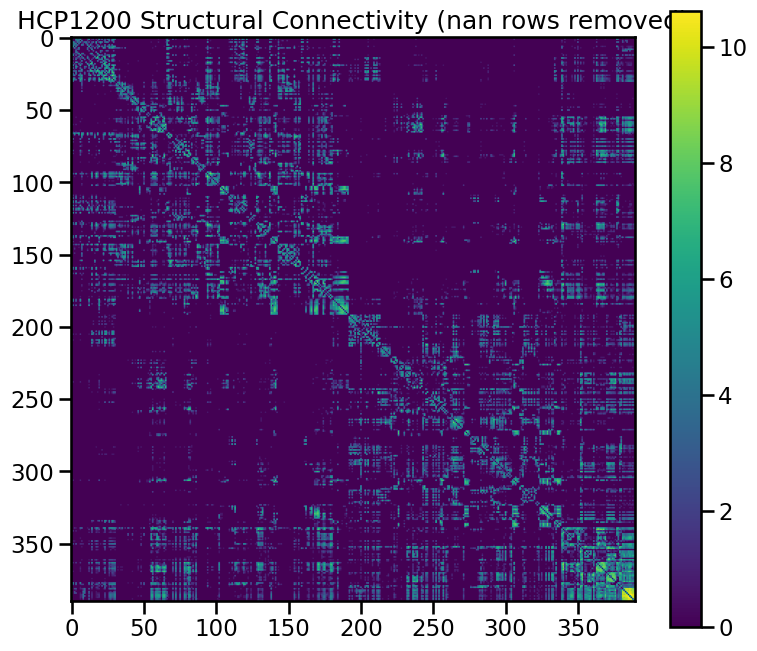

In [104]:
print("AHBA_S456_transcriptome shape:", AHBA_S456_transcriptome.shape)
print("HCP1200_S456_structural_count shape:", HCP1200_S456_structural_count.shape)
print("UKBB_S456_functional_conn shape:", UKBB_S456_functional_conn.shape)

# Store labels and network labels from atlas info
region_labels = UKBB_S456_atlas_info['label'].tolist()
network_labels = UKBB_S456_atlas_info['network_label'].tolist()

# Remove nan rows and columns from connectomes using nan_rows directly
HCP1200_S456_structural_count = HCP1200_S456_structural_count[~nan_rows][:, ~nan_rows]

# Display resulting connectomes
plt.figure(figsize=(20, 8))

plt.subplot(121)
plt.imshow(HCP1200_S456_structural_count, cmap='viridis')
plt.colorbar()
plt.title('HCP1200 Structural Connectivity (nan rows removed)')


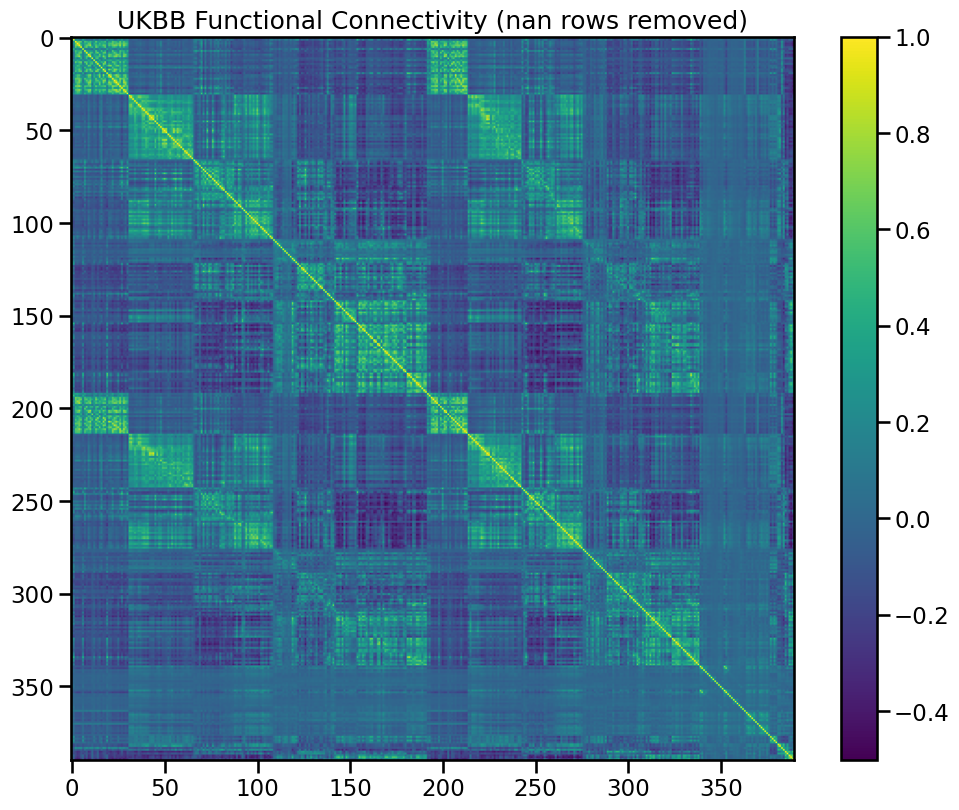

In [105]:

plt.figure(figsize=(20, 8))

UKBB_S456_functional_conn = np.array(UKBB_S456_functional_conn)[~nan_rows][:, ~nan_rows]
plt.subplot(122)
plt.imshow(UKBB_S456_functional_conn, cmap='viridis')
plt.colorbar()
plt.title('UKBB Functional Connectivity (nan rows removed)')

plt.tight_layout()
plt.show()

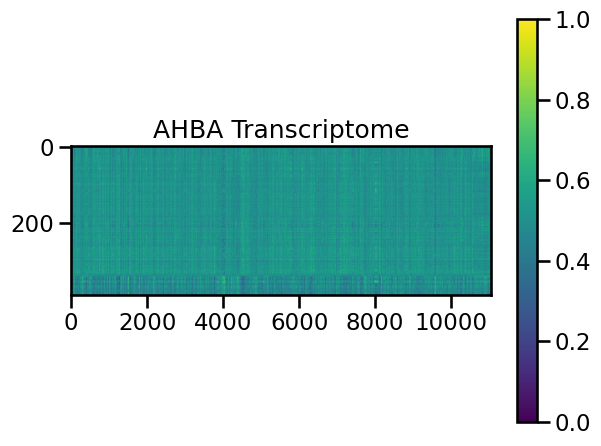

In [106]:
plt.imshow(AHBA_S456_transcriptome, cmap='viridis', aspect=10)
plt.title('AHBA Transcriptome')
plt.colorbar()
plt.tight_layout()
plt.show()


In [107]:
network_labels = UKBB_S456_atlas_info['network_label'].tolist()
region_labels = UKBB_S456_atlas_info['label'].tolist()
print("Network labels shape:", len(network_labels))
print("Region labels shape:", len(region_labels))


Network labels shape: 390
Region labels shape: 390


In [108]:
print("AHBA_S456_transcriptome shape:", AHBA_S456_transcriptome.shape)
print("HCP1200_S456_structural_count shape:", HCP1200_S456_structural_count.shape)
print("UKBB_S456_functional_conn shape:", UKBB_S456_functional_conn.shape)

AHBA_S456_transcriptome shape: (390, 11053)
HCP1200_S456_structural_count shape: (390, 390)
UKBB_S456_functional_conn shape: (390, 390)


In [109]:
# Compute 2D and 3D UMAP embeddings of transcriptome data
umap_2d = umap.UMAP(n_components=2, random_state=42)
umap_2d_embedding = umap_2d.fit_transform(AHBA_S456_transcriptome)

umap_3d = umap.UMAP(n_components=3, random_state=42)
umap_3d_embedding = umap_3d.fit_transform(AHBA_S456_transcriptome)

# Create figures for UMAP visualization
fig_2d = go.Figure()
fig_3d = go.Figure()

# Plot each point colored by network - 2D
for network in np.unique(network_labels):
    mask = np.array(network_labels) == network
    fig_2d.add_trace(go.Scatter(
        x=umap_2d_embedding[mask, 0],
        y=umap_2d_embedding[mask, 1],
        mode='markers',
        marker=dict(
            size=8,
            color=network_colors[network],
            opacity=0.6
        ),
        name=network,
        text=[region_labels[i] for i in np.where(mask)[0]],
        hoverinfo='text'
    ))

# Plot each point colored by network - 3D
for network in np.unique(network_labels):
    mask = np.array(network_labels) == network
    fig_3d.add_trace(go.Scatter3d(
        x=umap_3d_embedding[mask, 0],
        y=umap_3d_embedding[mask, 1],
        z=umap_3d_embedding[mask, 2],
        mode='markers',
        marker=dict(
            size=6,
            color=network_colors[network],
            opacity=0.6
        ),
        name=network,
        text=[region_labels[i] for i in np.where(mask)[0]],
        hoverinfo='text'
    ))

# Update 2D layout
fig_2d.update_layout(
    xaxis_title='UMAP 1',
    yaxis_title='UMAP 2',
    title='2D UMAP of Gene Expression Colored by Network',
    showlegend=True,
    width=800,
    height=800
)

# Update 3D layout
fig_3d.update_layout(
    scene=dict(
        xaxis_title='UMAP 1',
        yaxis_title='UMAP 2',
        zaxis_title='UMAP 3',
        aspectmode='cube'
    ),
    title='3D UMAP of Gene Expression Colored by Network',
    showlegend=True,
    width=800,
    height=800
)

fig_2d.show()
fig_3d.show()


In [114]:
# Filter out subcortex and cerebellum networks
cortical_mask = ~np.array([label in ['Subcortex', 'Cerebellum'] for label in network_labels])
cortical_transcriptome = AHBA_S456_transcriptome[cortical_mask]
cortical_network_labels = np.array(network_labels)[cortical_mask]
cortical_region_labels = np.array(region_labels)[cortical_mask]

# Filter structural and functional connectivity matrices using cortical mask
cortical_structural = HCP1200_S456_structural_count[cortical_mask][:, cortical_mask]
cortical_functional = np.array(UKBB_S456_functional_conn)[cortical_mask][:, cortical_mask]

print("Cortical structural connectivity shape:", cortical_structural.shape)
print("Cortical functional connectivity shape:", cortical_functional.shape)


# Compute 2D and 3D UMAP embeddings of filtered transcriptome data
umap_2d = umap.UMAP(n_components=2, random_state=42)
umap_2d_embedding = umap_2d.fit_transform(cortical_transcriptome)

umap_3d = umap.UMAP(n_components=3, random_state=42)
umap_3d_embedding = umap_3d.fit_transform(cortical_transcriptome)

# Create figures for UMAP visualization
fig_2d = go.Figure()
fig_3d = go.Figure()

# Plot each point colored by network - 2D
for network in np.unique(cortical_network_labels):
    mask = cortical_network_labels == network
    fig_2d.add_trace(go.Scatter(
        x=umap_2d_embedding[mask, 0],
        y=umap_2d_embedding[mask, 1],
        mode='markers',
        marker=dict(
            size=8,
            color=network_colors[network],
            opacity=0.6
        ),
        name=network,
        text=[cortical_region_labels[i] for i in np.where(mask)[0]],
        hoverinfo='text'
    ))

# Plot each point colored by network - 3D
for network in np.unique(cortical_network_labels):
    mask = cortical_network_labels == network
    fig_3d.add_trace(go.Scatter3d(
        x=umap_3d_embedding[mask, 0],
        y=umap_3d_embedding[mask, 1],
        z=umap_3d_embedding[mask, 2],
        mode='markers',
        marker=dict(
            size=6,
            color=network_colors[network],
            opacity=0.6
        ),
        name=network,
        text=[cortical_region_labels[i] for i in np.where(mask)[0]],
        hoverinfo='text'
    ))

# Update 2D layout
fig_2d.update_layout(
    xaxis_title='UMAP 1',
    yaxis_title='UMAP 2',
    title='2D UMAP of Cortical Gene Expression Colored by Network',
    showlegend=True,
    width=800,
    height=800
)

# Update 3D layout
fig_3d.update_layout(
    scene=dict(
        xaxis_title='UMAP 1',
        yaxis_title='UMAP 2',
        zaxis_title='UMAP 3',
        aspectmode='cube'
    ),
    title='3D UMAP of Cortical Gene Expression Colored by Network',
    showlegend=True,
    width=800,
    height=800
)

fig_2d.show()
fig_3d.show()


Cortical structural connectivity shape: (339, 339)
Cortical functional connectivity shape: (339, 339)


In [115]:
umap_2d_embedding = umap_2d.fit_transform(cortical_transcriptome)
fig_2d_combined = go.Figure()


# Plot each point colored by network - 2D
for network in np.unique(cortical_network_labels):
    mask = cortical_network_labels == network
    fig_2d_combined.add_trace(go.Scatter(
        x=umap_2d_embedding[mask, 0],
        y=umap_2d_embedding[mask, 1],
        mode='markers',
        marker=dict(
            size=8,
            color=network_colors[network],
            opacity=0.6
        ),
        name=network,
        text=[cortical_region_labels[i] for i in np.where(mask)[0]],
        hoverinfo='text'
    ))

# Process structural connections
structural_connectome = HCP1200_S456_structural_count_cortical
struct_clipped = np.clip(structural_connectome, 0, None)
struct_max = np.max(struct_clipped)
struct_min = np.min(struct_clipped)
struct_norm = (struct_clipped - struct_min) / (struct_max - struct_min)

# Process functional connections
functional_connectome = UKBB_S456_functional_conn_cortical
func_clipped = np.clip(functional_connectome, 0, 1)
func_max = np.max(func_clipped)
func_min = np.min(func_clipped)
func_norm = (func_clipped - func_min) / (func_max - func_min)

# Set thresholds and colormaps
min_threshold = 0.8
max_threshold = 1
struct_colors = plt.cm.Reds  # Yellow-green for structural
func_colors = plt.cm.Blues    # Red-purple for functional

# Add edges for both types of connections
for i in range(len(structural_connectome)):
    for j in range(i+1, len(structural_connectome)):
        # Add structural connections
        if min_threshold <= struct_norm[i,j] <= max_threshold:
            rgba_color = struct_colors(struct_norm[i,j])
            opacity = 0.3 * struct_norm[i,j]**2
            edge_color = f'rgba({int(rgba_color[0]*255)},{int(rgba_color[1]*255)},{int(rgba_color[2]*255)},{opacity})'
            
            fig_2d_combined.add_trace(go.Scatter(
                x=[umap_2d_embedding[i,0], umap_2d_embedding[j,0]],
                y=[umap_2d_embedding[i,1], umap_2d_embedding[j,1]],
                mode='lines',
                line=dict(
                    width=1.5,
                    color=edge_color
                ),
                name='Structural' if i == 0 and j == 1 else None,  # Add name only once for legend
                hoverinfo='none',
                showlegend=True if i == 0 and j == 1 else False
            ))
            
        # Add functional connections
        if min_threshold <= func_norm[i,j] <= max_threshold:
            rgba_color = func_colors(func_norm[i,j])
            opacity = 0.3 * func_norm[i,j]**2
            edge_color = f'rgba({int(rgba_color[0]*255)},{int(rgba_color[1]*255)},{int(rgba_color[2]*255)},{opacity})'
            
            fig_2d_combined.add_trace(go.Scatter(
                x=[umap_2d_embedding[i,0], umap_2d_embedding[j,0]],
                y=[umap_2d_embedding[i,1], umap_2d_embedding[j,1]],
                mode='lines',
                line=dict(
                    width=1.5,
                    color=edge_color
                ),
                name='Functional' if i == 0 and j == 1 else None,  # Add name only once for legend
                hoverinfo='none',
                showlegend=True if i == 0 and j == 1 else False
            ))

# Update layout
fig_2d_combined.update_layout(
    xaxis_title='UMAP 1',
    yaxis_title='UMAP 2',
    title=f'2D UMAP of Cortical Gene Expression with Structural and Functional Connections (threshold={min_threshold:.1f}-{max_threshold:.1f})',
    showlegend=True,
    width=1000,
    height=1000
)

fig_2d_combined.show()

PCA version

In [116]:

pca_2d = PCA(n_components=2)
pca_2d_embedding = pca_2d.fit_transform(cortical_transcriptome)
fig_2d_combined = go.Figure()

# Plot each point colored by network - 2D
for network in np.unique(cortical_network_labels):
    mask = cortical_network_labels == network
    fig_2d_combined.add_trace(go.Scatter(
        x=pca_2d_embedding[mask, 0],
        y=pca_2d_embedding[mask, 1],
        mode='markers',
        marker=dict(
            size=8,
            color=network_colors[network],
            opacity=0.6
        ),
        name=network,
        text=[cortical_region_labels[i] for i in np.where(mask)[0]],
        hoverinfo='text'
    ))

# Process structural connections
structural_connectome = HCP1200_S456_structural_count_cortical
struct_clipped = np.clip(structural_connectome, 0, None)
struct_max = np.max(struct_clipped)
struct_min = np.min(struct_clipped)
struct_norm = (struct_clipped - struct_min) / (struct_max - struct_min)

# Process functional connections
functional_connectome = UKBB_S456_functional_conn_cortical
func_clipped = np.clip(functional_connectome, 0, 1)
func_max = np.max(func_clipped)
func_min = np.min(func_clipped)
func_norm = (func_clipped - func_min) / (func_max - func_min)

# Set thresholds and colormaps
min_threshold = 0.8
max_threshold = 1
struct_colors = plt.cm.Reds  # Yellow-green for structural
func_colors = plt.cm.Blues    # Red-purple for functional

# Add edges for both types of connections
for i in range(len(structural_connectome)):
    for j in range(i+1, len(structural_connectome)):
        # Add structural connections
        if min_threshold <= struct_norm[i,j] <= max_threshold:
            rgba_color = struct_colors(struct_norm[i,j])
            opacity = 0.3 * struct_norm[i,j]**2
            edge_color = f'rgba({int(rgba_color[0]*255)},{int(rgba_color[1]*255)},{int(rgba_color[2]*255)},{opacity})'
            
            fig_2d_combined.add_trace(go.Scatter(
                x=[pca_2d_embedding[i,0], pca_2d_embedding[j,0]],
                y=[pca_2d_embedding[i,1], pca_2d_embedding[j,1]],
                mode='lines',
                line=dict(
                    width=1.5,
                    color=edge_color
                ),
                name='Structural' if i == 0 and j == 1 else None,  # Add name only once for legend
                hoverinfo='none',
                showlegend=True if i == 0 and j == 1 else False
            ))
            
        # Add functional connections
        if min_threshold <= func_norm[i,j] <= max_threshold:
            rgba_color = func_colors(func_norm[i,j])
            opacity = 0.3 * func_norm[i,j]**2
            edge_color = f'rgba({int(rgba_color[0]*255)},{int(rgba_color[1]*255)},{int(rgba_color[2]*255)},{opacity})'
            
            fig_2d_combined.add_trace(go.Scatter(
                x=[pca_2d_embedding[i,0], pca_2d_embedding[j,0]],
                y=[pca_2d_embedding[i,1], pca_2d_embedding[j,1]],
                mode='lines',
                line=dict(
                    width=1.5,
                    color=edge_color
                ),
                name='Functional' if i == 0 and j == 1 else None,  # Add name only once for legend
                hoverinfo='none',
                showlegend=True if i == 0 and j == 1 else False
            ))

# Update layout
fig_2d_combined.update_layout(
    xaxis_title='PC1',
    yaxis_title='PC2', 
    title=f'2D PCA of Cortical Gene Expression with Structural and Functional Connections (threshold={min_threshold:.1f}-{max_threshold:.1f})',
    showlegend=True,
    width=1000,
    height=1000
)

fig_2d_combined.show()